# Домашнее задание №3

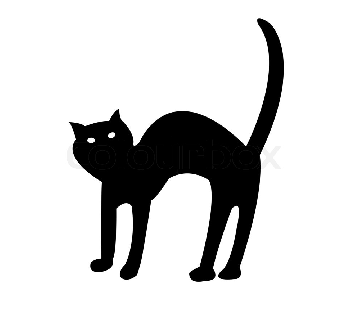

In [1]:
import numpy as np
import cv2
import matplotlib.pylab as plt
%matplotlib inline

def show(img):
    ax = plt.axes([0,0,1,1], frameon=False)
    ax.set_axis_off()
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    
def show_gray(img):
    ax = plt.axes([0,0,1,1], frameon=False)
    ax.set_axis_off()
    plt.imshow(img, cmap="gray")

cat = cv2.imread("cat.jpg")
show(cat)

**1. (3 балла)** Выделите границы на изображении portrait.jpg:

• при помощи градиента,

• при помощи лапласиана,

• с помощью морфологической обработки.                                                         

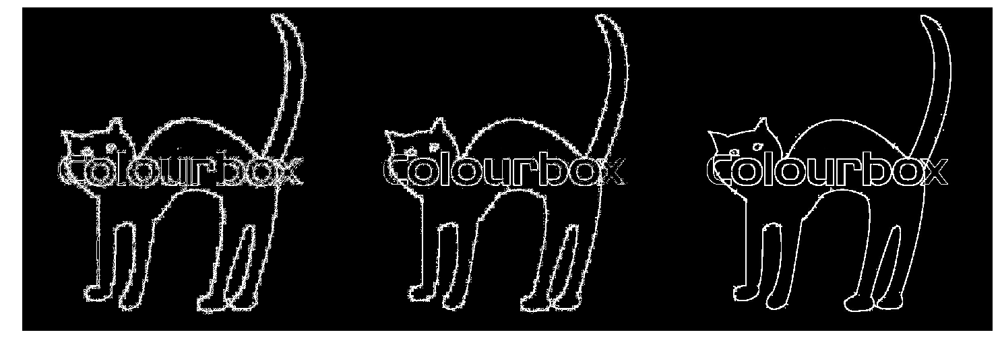

In [2]:
portrait = cv2.imread("portrait.jpg")

# при помощи градиента
horisontal_grad = np.abs(np.gradient(portrait, axis=1))
vertical_grad = np.abs(np.gradient(portrait, axis=0))
grad = (horisontal_grad + vertical_grad).astype(np.uint8)
grad[grad > 10] = 255

# при помощи лапласиана
laplacian = np.abs(cv2.Laplacian(cat, cv2.CV_32F)).astype(np.uint8)
laplacian[laplacian > 5] = 255

# с помощью морфологической обработки
morph = cv2.morphologyEx(cat, cv2.MORPH_GRADIENT, np.ones((3,3)))
morph[morph > 10] = 255

plt.figure(figsize=(20,8))
show(np.hstack((grad, laplacian, morph)))

**2. (4 балла)** Реализуйте двухпроходный алгоритм выделения компонент связности на бинарном изображении. Значение фона (0 или 1) и структурный элемент передавайте в качестве параметра.

In [3]:
from collections import defaultdict

eq_table = {}

def get_main_component(i):
    if i != eq_table[i]:
        eq_table[i] = get_main_component(eq_table[i])
        return eq_table[i]
    else:
        return i

def compound_components(src, struct_mat, background):
    w_src, h_src = src.shape
    w_str, h_str = struct_mat.shape
    component_marks = np.zeros((w_src + w_str, h_src + h_str))
    n_component = 0

    # первый проход
    for i in range(w_src):
        for j in range(h_src):
            if src[i][j] != background:
                prod = struct_mat * component_marks[i:i + w_str, j:j + h_str]
                marks = [x for x in prod.reshape(-1) if x !=0]
                if marks:
                    component_marks[i + w_str // 2][j + h_str // 2] = min(marks)
                    for x in marks:
                        for y in marks:
                            x = get_main_component(x)
                            y = get_main_component(y)
                            if x != y:
                                if x < y:
                                    eq_table[x] = y
                                else:
                                    eq_table[y] = x

                else:
                    n_component += 1
                    component_marks[i + w_str // 2][j + h_str // 2] = n_component
                    eq_table[n_component] = n_component

    # второй проход
    components = defaultdict(list)
    for i in range(w_src):
        for j in range(h_src):
            if src[i][j] != background:
                main_component = get_main_component(component_marks[w_str // 2 + i][h_str // 2 + j])
                components[main_component].append((i, j))
    return list(components.values())


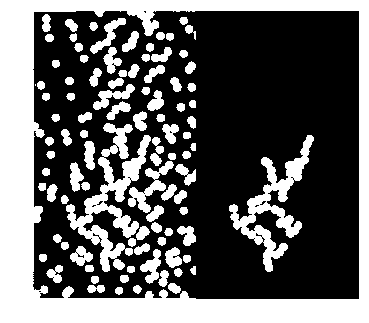

In [4]:
# выделим максимальную по количеству точек компоненту
img = cv2.imread("circles.jpg", 0)
img[img < 50] = 0
img[img >= 50] = 255
struct = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(3,3))
comps = compound_components(img, struct, 0)
res = np.zeros((img.shape[0], img.shape[1]))
max_component = max(comps, key=len)
for x,y in max_component:
    res[x][y] = 255
show_gray(np.hstack((img,res)))

**3. (5 баллов)** Выделите в изображении $table.jpg$ границы таблицы с использова- нием морфологических операций. Результатом обработки должно быть изображение, в котором удален весь текст и оставлены только границы таблицы

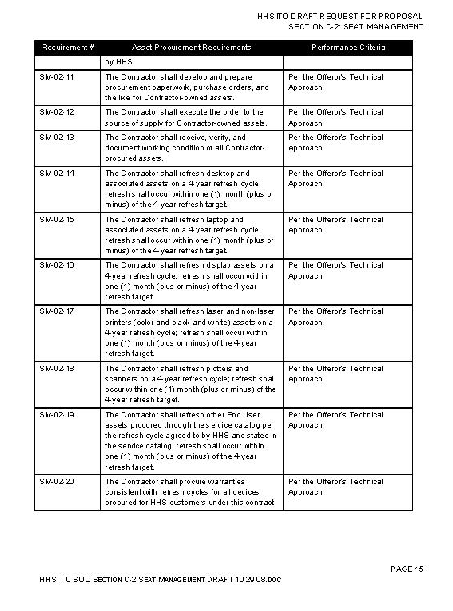

In [5]:
table = cv2.imread("table.jpg")
plt.figure(figsize = (8,8))
show(table)

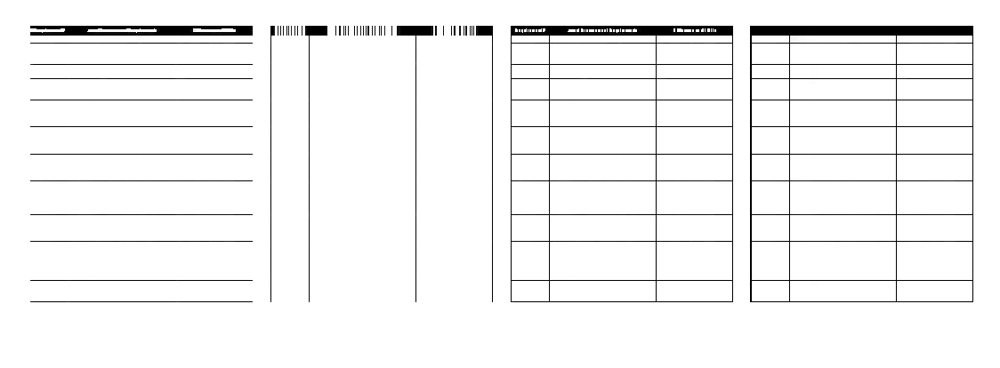

In [6]:
horizontal = cv2.morphologyEx(table, cv2.MORPH_CLOSE, np.ones((1,15)))
vertical = cv2.morphologyEx(table, cv2.MORPH_CLOSE, np.ones((15,1)))
together = cv2.bitwise_and(horizontal, vertical)
res = cv2.morphologyEx(together, cv2.MORPH_OPEN, np.ones((15,15)))
plt.figure(figsize = (15,15))
show(np.hstack((horizontal, vertical, together, res)))

**4. (7 баллов)** Для изображения $circles.jpg$ реализуйте морфологический алгоритм для построения трех изображений, которые бы содержали соответственно:

• только частицы, касающиеся краев изображения, 

• только группы перекрывающихся частиц,

• только одиночные круглые частицы.

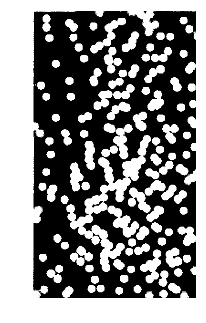

In [7]:
circles = cv2.imread("circles.jpg")
show(circles)

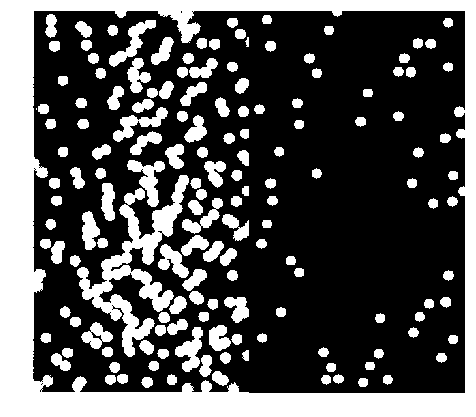

In [35]:
# одиночные круглые частицы
gray = cv2.imread("circles.jpg", 0)
_, binary = cv2.threshold(gray, 100, 255, cv2.THRESH_BINARY)
inverted = 255 - binary

kernel1 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (15, 15))
kernel2 = 1 - cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (18, 18))

gray_erode = cv2.morphologyEx(binary, cv2.MORPH_ERODE, kernel1)
inverted_erode = cv2.morphologyEx(inverted, cv2.MORPH_ERODE, kernel2)

points = gray_erode & inverted_erode
points = cv2.morphologyEx(points, cv2.MORPH_DILATE, kernel1)

plt.figure(figsize=(6,6))
show_gray(np.hstack((binary, points)))

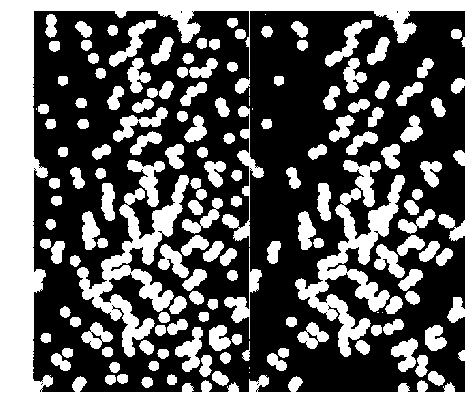

In [36]:
# группы перекрывающихся частиц
unions = np.copy(binary)
kernel = np.ones((4, 4), np.uint8)
points_dilate = cv2.morphologyEx(points, cv2.MORPH_DILATE, kernel)
unions &= 255 - points_dilate

plt.figure(figsize=(6,6))
show_gray(np.hstack((binary, unions)))

In [10]:
# частицы, касающиеся краев изображения - не получилось(

**5. (5 баллов) ** Отделите монеты от фона на изображении $coins\_1.jpg$, отсортируйте монеты по убыванию размера. Сгенерируйте результирующее изображение с цветной разметкой областей, соответствующих монетам на исходном изображении: на черном фоне должны быть выделены разными цветами области, соответствующие монетам. В центре каждой выделенной области разместите порядковый номер монеты в соответствии с сортировкой монет по размеру (в центре области, соответствующей самой большой монете, должно стоять число 1)

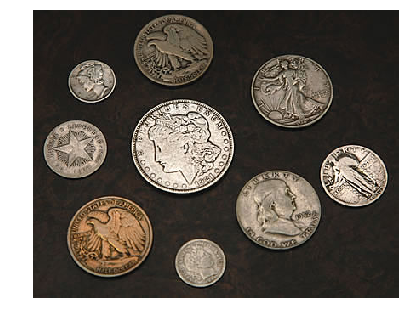

In [11]:
coins_1 = cv2.imread("coins_1.jpg")
show(coins_1)

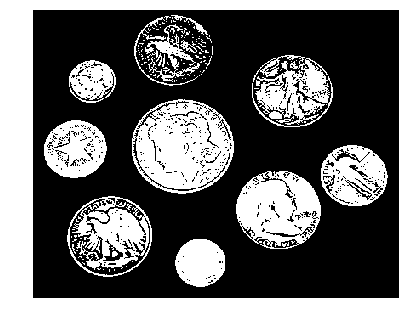

In [12]:
coins_1 = cv2.imread("coins_1.jpg", 0)
thresh, im_bw = cv2.threshold(coins_1, 50, 255, cv2.THRESH_OTSU)
show_gray(im_bw)

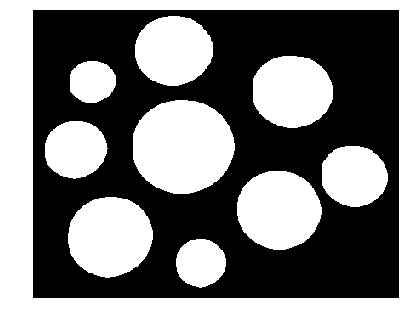

In [13]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(8,8))
close = cv2.morphologyEx(im_bw, cv2.MORPH_CLOSE, kernel)
show_gray(close)

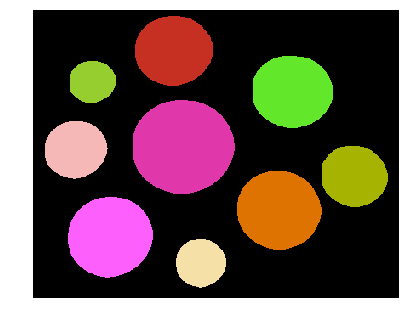

In [17]:
from random import randint

comps = compound_components(close, struct, 0)
res = np.zeros((*close.shape,3)).astype(np.uint8)
for i, component in enumerate(comps):
    color = np.array([randint(0, 255), randint(0, 255), randint(0, 255)])
    for x,y in component:
        res[x][y] = color
show(res)

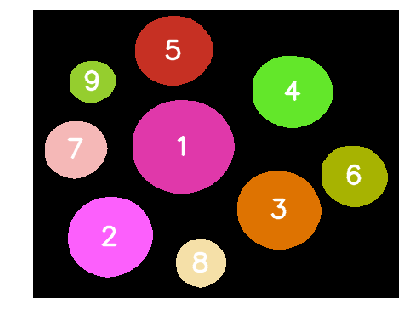

In [18]:
sorted_comps = sorted(comps, key=len, reverse=True)
for i, comp in enumerate(sorted_comps):
    x,y = tuple(map(np.mean, zip(*comp))) 
    cv2.putText(res, str(i+1), (int(y)-10, int(x)+10), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2, cv2.LINE_AA)
show(res)

**6. (5 баллов)** Отделите монеты от текста на изображении $coins\_2.jpg.$ Сгене- рируйте по входному изображению два изображения: на одном должны остаться только монеты, весь текст должен быть удален; на втором изображении должен остаться только текст, все монеты должны быть удалены.

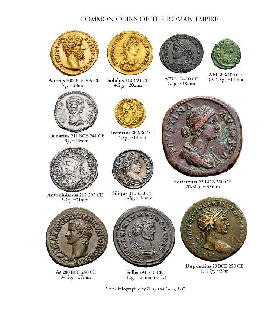

In [19]:
coins_2 = cv2.imread("coins_2.jpg")
show(coins_2)

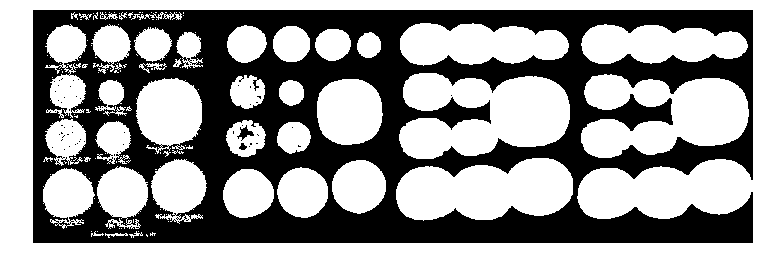

In [20]:
gray = cv2.cvtColor(coins_2, cv2.COLOR_BGR2GRAY)
_, binary = cv2.threshold(gray, 250, 255, cv2.THRESH_BINARY)
binary = 255 - binary

kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (10,10))
opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)

kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (50,17))
dilate = cv2.morphologyEx(opening, cv2.MORPH_DILATE, kernel)

kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (10,10))
erode = cv2.morphologyEx(dilate, cv2.MORPH_ERODE, kernel)

plt.figure(figsize=(10,8))
show_gray(np.hstack((binary, opening, dilate, erode)))

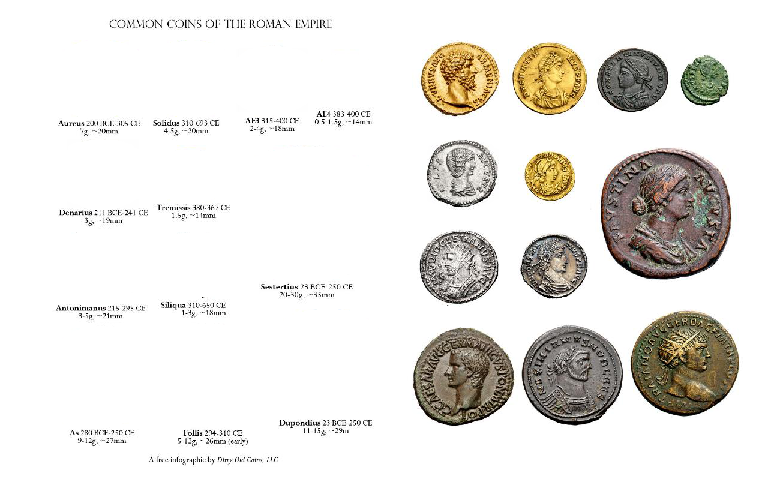

In [21]:
text, coins = np.copy(coins_2), np.copy(coins_2)
text[erode == 255] = 255
plt.figure(figsize=(10,8))
coins[text != 255] = 255
show(np.hstack((text,coins)))

**7. (11 баллов) ** Для каждого из зашумленных изображений $coins\_noize\_1.jpg$, $coins\_noize\_2.jpg$, $coins\_noize\_3.jpg$: выделите целые монеты, сгруппируйте их по размеру и посчитайте число монет в каждой группе. На выходе программа должна выдавать полученное число групп монет, средний размер монеты для каждой группы и число монет
в каждой группе, а также изображение, визуализирующее результат. На данном изображении на черном фоне должны быть цветом выделены области, соответствующие монетам. Монеты, принадлежащие одной группе, должны быть обозначены одним и тем же цветом.

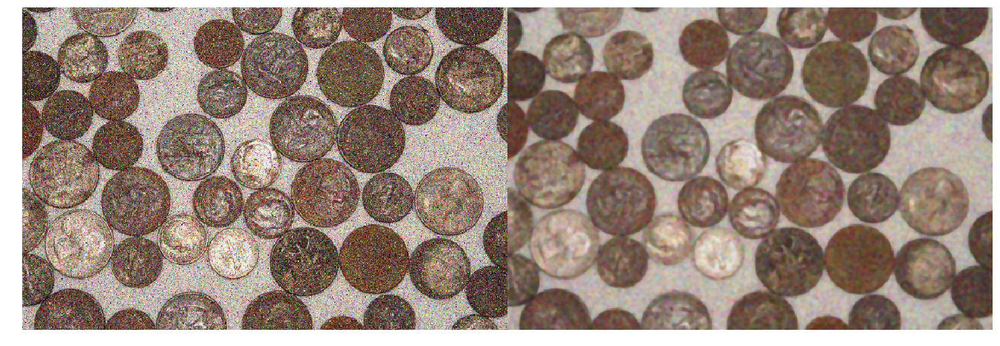

In [22]:
coins_noize_1 = cv2.imread("coins_noize_1.jpg")
filter_1 = cv2.GaussianBlur(coins_noize_1, (3, 3), 4)
filter_1 = cv2.medianBlur(filter_1, 5)
plt.figure(figsize=(20,8))
show(np.hstack((coins_noize_1, filter_1)))

Number of groups: 16
Number of coins in group #0: 3
Mean diameter for group  #0: 68.0
Number of coins in group #1: 1
Mean diameter for group  #1: 98.0
Number of coins in group #2: 2
Mean diameter for group  #2: 84.0
Number of coins in group #3: 3
Mean diameter for group  #3: 94.0
Number of coins in group #4: 3
Mean diameter for group  #4: 96.0
Number of coins in group #5: 1
Mean diameter for group  #5: 90.0
Number of coins in group #6: 1
Mean diameter for group  #6: 82.0
Number of coins in group #7: 3
Mean diameter for group  #7: 62.0
Number of coins in group #8: 1
Mean diameter for group  #8: 92.0
Number of coins in group #9: 2
Mean diameter for group  #9: 66.0
Number of coins in group #10: 1
Mean diameter for group  #10: 80.0
Number of coins in group #11: 2
Mean diameter for group  #11: 86.0
Number of coins in group #12: 2
Mean diameter for group  #12: 74.0
Number of coins in group #13: 2
Mean diameter for group  #13: 78.0
Number of coins in group #14: 1
Mean diameter for group  #14:

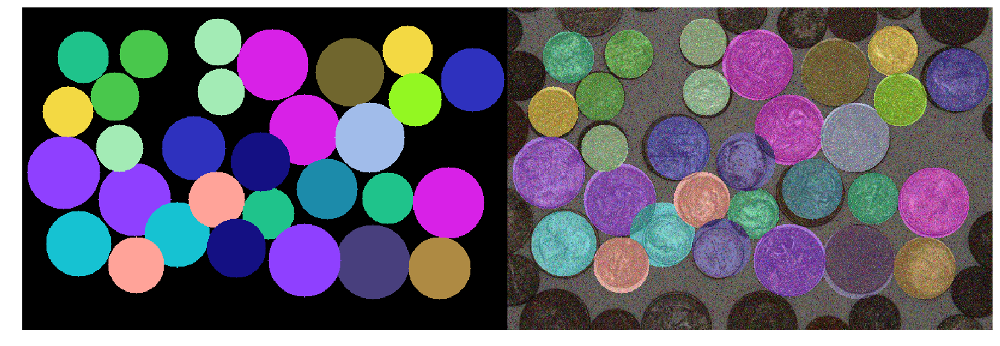

In [23]:
from collections import defaultdict
from random import randint

def get_circles(filtered, filter_is_gray=False):
    if filter_is_gray:
        gray = filtered
    else:
        gray = cv2.cvtColor(filtered, cv2.COLOR_BGR2GRAY)
    circles = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, 1, 60, param1=60, param2=20, minRadius=30, maxRadius=50)
    circles = np.round(circles[0, :]).astype(int)
    return circles

def get_full_circles(circles, shape_img):
    full_circles = []
    for (x, y, r) in circles:
        if x+r < shape_img[1] and x-r > 0 and y+r < shape_img[0] and y-r > 0:
            full_circles.append((x, y, r))
    return full_circles

def group_circles(circles):
    groups = defaultdict(list)
    for (x, y, r) in circles:
        groups[r].append((x, y, r))
    return list(groups.values()) 

def get_colored_circles(groups, shape):
    colored_circles = np.zeros(shape).astype(np.uint8)
    for group in groups:
        color = (randint(0, 255), randint(0, 255), randint(0, 255))
        for (x, y, r) in group:
            cv2.circle(colored_circles, (x, y), r, color, -1)
    return colored_circles

def print_info(groups):
    print('Number of groups:', len(groups))
    for i, group in enumerate(groups):
        mean_diameter = np.mean([x[2] for x in group]) * 2
        print('Number of coins in group #{}: {}'.format(i, len(group)))
        print('Mean diameter for group  #{}: {}'.format(i, mean_diameter))

def print_res(src, filtered):
    circles = get_circles(filtered)
    circles = get_full_circles(circles, coins_noize_1.shape)
    groups = group_circles(circles)
    colored_circles = get_colored_circles(groups, src.shape)
    union = cv2.addWeighted(src, 0.5, colored_circles, 0.5, 0)
    print_info(groups)
    plt.figure(figsize=(20,8))
    show(np.hstack((colored_circles, union)))

print_res(coins_noize_1, filter_1)     

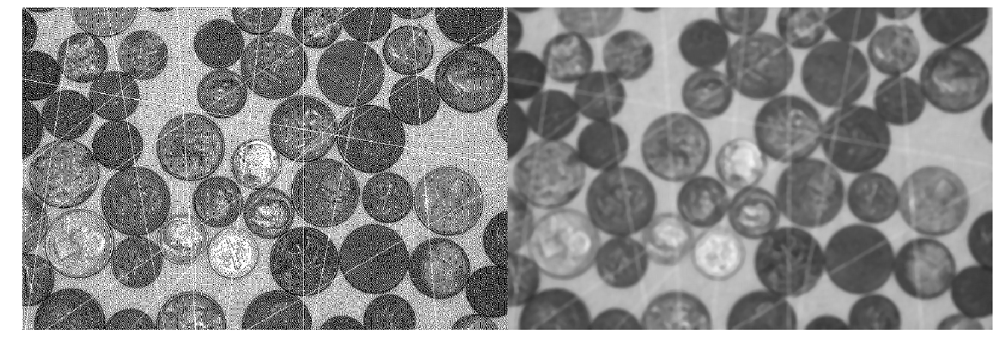

In [24]:
coins_noize_2 = cv2.imread("coins_noize_2.jpg")
filter_2 = cv2.GaussianBlur(coins_noize_2, (7, 7), 3)
filter_2 = cv2.medianBlur(filter_2, 5)
plt.figure(figsize=(20,8))
show(np.hstack((coins_noize_2, filter_2)))

Number of groups: 15
Number of coins in group #0: 2
Mean diameter for group  #0: 90.0
Number of coins in group #1: 2
Mean diameter for group  #1: 88.0
Number of coins in group #2: 3
Mean diameter for group  #2: 92.0
Number of coins in group #3: 1
Mean diameter for group  #3: 80.0
Number of coins in group #4: 1
Mean diameter for group  #4: 94.0
Number of coins in group #5: 7
Mean diameter for group  #5: 68.0
Number of coins in group #6: 2
Mean diameter for group  #6: 66.0
Number of coins in group #7: 1
Mean diameter for group  #7: 60.0
Number of coins in group #8: 2
Mean diameter for group  #8: 86.0
Number of coins in group #9: 1
Mean diameter for group  #9: 84.0
Number of coins in group #10: 1
Mean diameter for group  #10: 98.0
Number of coins in group #11: 3
Mean diameter for group  #11: 70.0
Number of coins in group #12: 1
Mean diameter for group  #12: 96.0
Number of coins in group #13: 2
Mean diameter for group  #13: 62.0
Number of coins in group #14: 1
Mean diameter for group  #14:

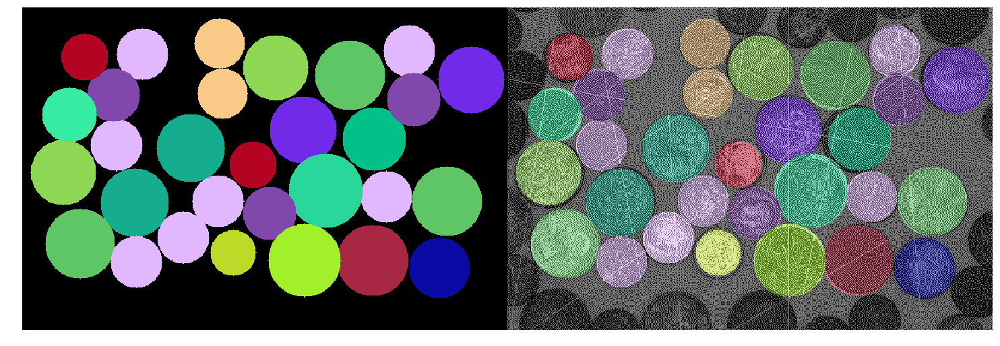

In [25]:
print_res(coins_noize_2, filter_2)

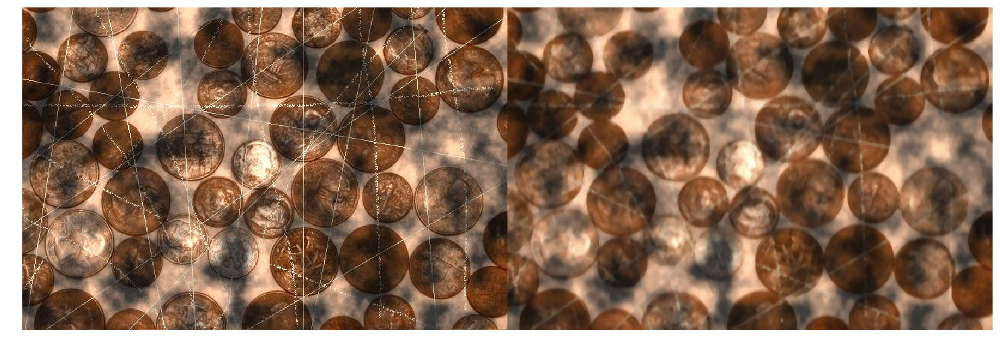

In [26]:
coins_noize_3 = cv2.imread("coins_noize_3.jpg")
filter_3 = cv2.GaussianBlur(coins_noize_3, (1, 5), 3)
filter_3 = cv2.medianBlur(filter_3, 5)
plt.figure(figsize=(20,8))
show(np.hstack((coins_noize_3, filter_3)))

Number of groups: 17
Number of coins in group #0: 2
Mean diameter for group  #0: 84.0
Number of coins in group #1: 3
Mean diameter for group  #1: 64.0
Number of coins in group #2: 1
Mean diameter for group  #2: 82.0
Number of coins in group #3: 3
Mean diameter for group  #3: 90.0
Number of coins in group #4: 1
Mean diameter for group  #4: 80.0
Number of coins in group #5: 2
Mean diameter for group  #5: 94.0
Number of coins in group #6: 1
Mean diameter for group  #6: 86.0
Number of coins in group #7: 3
Mean diameter for group  #7: 66.0
Number of coins in group #8: 2
Mean diameter for group  #8: 70.0
Number of coins in group #9: 1
Mean diameter for group  #9: 96.0
Number of coins in group #10: 2
Mean diameter for group  #10: 92.0
Number of coins in group #11: 1
Mean diameter for group  #11: 88.0
Number of coins in group #12: 1
Mean diameter for group  #12: 78.0
Number of coins in group #13: 1
Mean diameter for group  #13: 74.0
Number of coins in group #14: 4
Mean diameter for group  #14:

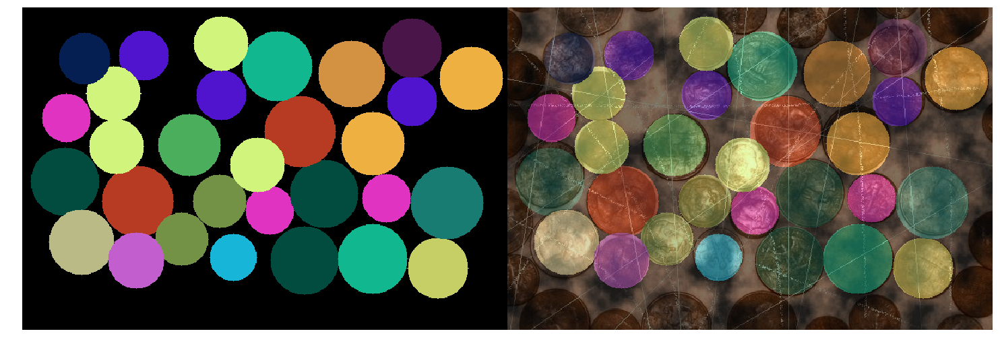

In [27]:
print_res(coins_noize_3, filter_3)

**8. (5 баллов) ** Для каждого из зашумленных изображений $coins\_noize\_1.jpg$, $coins\_noize\_2.jpg$, $coins\_noize\_3.jpg$: задача аналогична предыдущей, только считать надо не только целые монеты, но и обрезанные краем изображения.

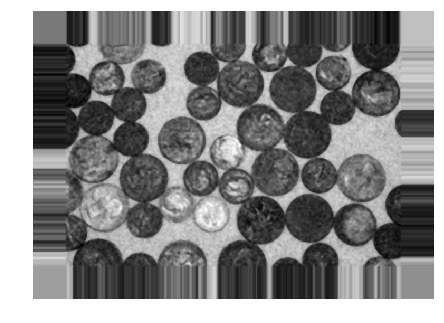

In [30]:
def expand_border(img_gray, n):
    w, h = img_gray.shape
    tmp = np.zeros((w + n//2*2, h + n//2*2))
    hn = n // 2
    tmp[hn : w + hn, hn : h + hn] = img_gray
    tmp[: hn, hn : h + hn] = img_gray[0]
    tmp[w+hn:, hn : h + hn] = img_gray[-1]
    tmp[:hn, :hn] = img_gray[0][0]
    tmp[:hn, h+hn:] = img_gray[0][-1]
    tmp[w+hn:, :hn] = img_gray[-1][0]
    tmp[w+hn:, h+hn:] = img_gray[-1][-1]
    for i in range(w):
        tmp[i+hn, : hn] = img_gray[i][0]
        tmp[i+hn, h+hn:] = img_gray[i][-1]
    return tmp

def print_res(src, filtered):
    circles = get_circles(filtered, filter_is_gray=True)
    groups = group_circles(circles)
    colored_circles = get_colored_circles(groups, (*filtered.shape, 3))
    union = cv2.addWeighted(src, 0.5, colored_circles[60:-60,60:-60] , 0.5, 0)
    print_info(groups)
    plt.figure(figsize=(20,8))
    show(np.hstack((colored_circles[60:-60,60:-60], union))) 

gray = cv2.cvtColor(filter_1, cv2.COLOR_BGR2GRAY)
show_gray(expand_border(gray, 120).astype(np.uint8))

Number of groups: 18
Number of coins in group #0: 4
Mean diameter for group  #0: 68.0
Number of coins in group #1: 1
Mean diameter for group  #1: 98.0
Number of coins in group #2: 3
Mean diameter for group  #2: 84.0
Number of coins in group #3: 5
Mean diameter for group  #3: 94.0
Number of coins in group #4: 5
Mean diameter for group  #4: 96.0
Number of coins in group #5: 1
Mean diameter for group  #5: 90.0
Number of coins in group #6: 1
Mean diameter for group  #6: 82.0
Number of coins in group #7: 6
Mean diameter for group  #7: 62.0
Number of coins in group #8: 2
Mean diameter for group  #8: 92.0
Number of coins in group #9: 3
Mean diameter for group  #9: 66.0
Number of coins in group #10: 2
Mean diameter for group  #10: 80.0
Number of coins in group #11: 2
Mean diameter for group  #11: 86.0
Number of coins in group #12: 3
Mean diameter for group  #12: 74.0
Number of coins in group #13: 2
Mean diameter for group  #13: 78.0
Number of coins in group #14: 2
Mean diameter for group  #14:

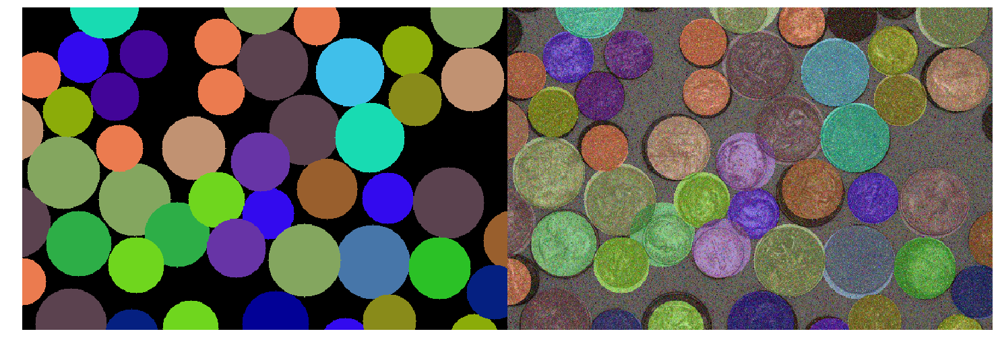

In [31]:
gray = cv2.cvtColor(filter_1, cv2.COLOR_BGR2GRAY)
tmp = expand_border(gray, 120).astype(np.uint8)
print_res(coins_noize_1, tmp)

Number of groups: 18
Number of coins in group #0: 4
Mean diameter for group  #0: 90.0
Number of coins in group #1: 3
Mean diameter for group  #1: 88.0
Number of coins in group #2: 3
Mean diameter for group  #2: 92.0
Number of coins in group #3: 1
Mean diameter for group  #3: 80.0
Number of coins in group #4: 1
Mean diameter for group  #4: 94.0
Number of coins in group #5: 12
Mean diameter for group  #5: 68.0
Number of coins in group #6: 2
Mean diameter for group  #6: 66.0
Number of coins in group #7: 1
Mean diameter for group  #7: 60.0
Number of coins in group #8: 4
Mean diameter for group  #8: 86.0
Number of coins in group #9: 1
Mean diameter for group  #9: 84.0
Number of coins in group #10: 1
Mean diameter for group  #10: 98.0
Number of coins in group #11: 4
Mean diameter for group  #11: 70.0
Number of coins in group #12: 1
Mean diameter for group  #12: 96.0
Number of coins in group #13: 2
Mean diameter for group  #13: 82.0
Number of coins in group #14: 2
Mean diameter for group  #14

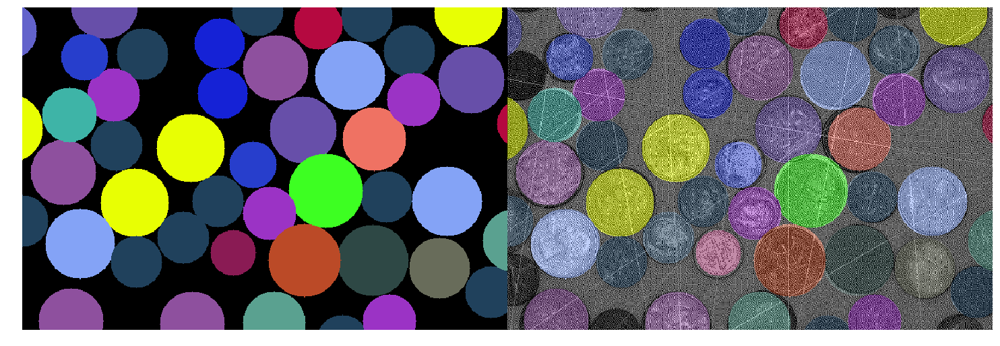

In [32]:
gray = cv2.cvtColor(filter_2, cv2.COLOR_BGR2GRAY)
tmp = expand_border(gray, 120).astype(np.uint8)
print_res(coins_noize_2, tmp)

Number of groups: 18
Number of coins in group #0: 2
Mean diameter for group  #0: 84.0
Number of coins in group #1: 3
Mean diameter for group  #1: 64.0
Number of coins in group #2: 3
Mean diameter for group  #2: 82.0
Number of coins in group #3: 5
Mean diameter for group  #3: 90.0
Number of coins in group #4: 1
Mean diameter for group  #4: 80.0
Number of coins in group #5: 2
Mean diameter for group  #5: 94.0
Number of coins in group #6: 1
Mean diameter for group  #6: 86.0
Number of coins in group #7: 3
Mean diameter for group  #7: 66.0
Number of coins in group #8: 2
Mean diameter for group  #8: 70.0
Number of coins in group #9: 2
Mean diameter for group  #9: 96.0
Number of coins in group #10: 2
Mean diameter for group  #10: 92.0
Number of coins in group #11: 1
Mean diameter for group  #11: 88.0
Number of coins in group #12: 1
Mean diameter for group  #12: 78.0
Number of coins in group #13: 1
Mean diameter for group  #13: 74.0
Number of coins in group #14: 4
Mean diameter for group  #14:

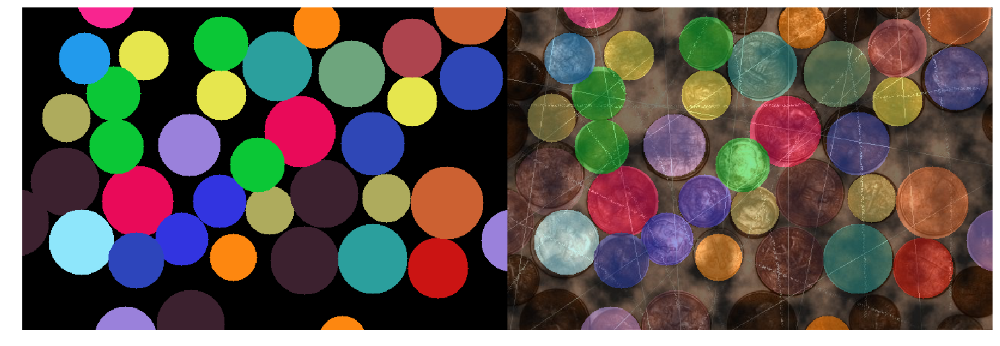

In [33]:
gray = cv2.cvtColor(filter_3, cv2.COLOR_BGR2GRAY)
tmp = expand_border(gray, 120).astype(np.uint8)
print_res(coins_noize_3, tmp)